In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import json
import pandas as pd
import numpy  as np

import matplotlib.pyplot as plt
import matplotlib.dates  as mdates

from datetime   import datetime, timezone
from legendmeta import LegendMetadata

from itertools import cycle

lmeta = LegendMetadata('/Users/romoluque_c/Repositories/legend-metadata/')

In [3]:
run_dict = {'p03':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p04':{'r000':{},'r001':{},'r002':{},'r003':{}},
            'p06':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p07':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{},'r007':{}}}
            #'p08':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{}}}

In [4]:
data_path = '/Users/romoluque_c/LEGEND/Energy_scale_group/Partitioning/data_example/'

In [5]:
dt    = datetime(2023, 4, 22, 5, 54, 22, tzinfo=timezone.utc)
chmap = lmeta.hardware.configuration.channelmaps.on(dt)
channel_dict = {}
for channel_name, channel_data in chmap.items():
    try:
        channel_dict[channel_data['daq']['rawid']] = (lmeta.channelmap(dt)[channel_name].type,
                                                      channel_name,
                                                      lmeta.channelmap(dt)[channel_name].production['mass_in_g'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['string'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['position'])
    except:
        continue

In [6]:
channel_dict;

In [7]:
for key, value in channel_dict.items():
    if value[0]== 'bege':
        print(key, value)
    #if value[3]== 1:
    #    print(key, value)

1107202 ('bege', 'B00035C', 634.0, 2, 1)
1110402 ('bege', 'B00032B', 716.0, 3, 1)
1110403 ('bege', 'B00091C', 627.0, 3, 2)
1112005 ('bege', 'B00000B', 697.0, 4, 1)
1113600 ('bege', 'B00000C', 815.0, 4, 2)
1113601 ('bege', 'B00061A', 731.0, 4, 3)
1113602 ('bege', 'B00061C', 634.0, 4, 4)
1113603 ('bege', 'B00076C', 824.0, 4, 5)
1113604 ('bege', 'B00079B', 736.0, 4, 6)
1113605 ('bege', 'B00079C', 812.0, 4, 7)
1120003 ('bege', 'B00089C', 595.0, 8, 1)
1120004 ('bege', 'B00089D', 526.0, 8, 2)
1078405 ('bege', 'B00002A', 545.0, 9, 1)
1080000 ('bege', 'B00089A', 524.0, 9, 2)
1080001 ('bege', 'B00091A', 627.0, 9, 3)
1080002 ('bege', 'B00091D', 693.0, 9, 4)
1083200 ('bege', 'B00091B', 650.0, 9, 14)
1083201 ('bege', 'B00000D', 813.0, 10, 1)
1083202 ('bege', 'B00002C', 788.0, 10, 2)
1083203 ('bege', 'B00032C', 743.0, 10, 3)
1083204 ('bege', 'B00032D', 720.0, 10, 4)
1083205 ('bege', 'B00035A', 768.0, 10, 5)
1084800 ('bege', 'B00035B', 810.0, 10, 6)
1084801 ('bege', 'B00061B', 751.0, 10, 7)
1084802 

In [8]:
def cal_energy(e_uncal, cal_pars):
    if len(cal_pars.keys())==2:
        #print('lin')
        return cal_pars['a'] * e_uncal + cal_pars['b'], 'lin'
    elif len(cal_pars.keys())==3:
        #print('quad')
        return cal_pars['a'] * e_uncal **2 + cal_pars['b'] * e_uncal + cal_pars['c'], 'quad'

In [9]:
def uncal_quad(e_cal, cal_pars):
    return (-cal_pars['b']+np.sqrt(cal_pars['b']**2-2*cal_pars['a']*(cal_pars['c']-e_cal)))/(2*cal_pars['a'])

### Let's choose all the ICPC detectors

In [10]:
all_params_ch = {}
all_channels  = ['ch1107202', 'ch1110402', 'ch1110403', 'ch1112005', 'ch1113600', 'ch1113601', 'ch1113602',
                 'ch1113603', 'ch1113604', 'ch1113605', 'ch1120003', 'ch1120004', 'ch1078405', 'ch1080000',
                 'ch1080001', 'ch1080002', 'ch1083200', 'ch1083201', 'ch1083202', 'ch1083203', 'ch1083204',
                 'ch1083205', 'ch1084800', 'ch1084801', 'ch1084802', 'ch1086403', 'ch1086404', 'ch1086405']

err_channels = []
for sel_channel in all_channels:
    
    pars_per_ch = {'mus_peaks':        {}, 'mus_err_peaks':   {},
                   'fwhms_peaks':      {}, 'fwhms_err_peaks': {},
                   'ecals_peaks':      {},
                   'Qbb_fwhms_in_keV': [], 'Qbb_fwhms_err_in_keV': [],
                   'eres_lin_pars0':   [], 'eres_lin_pars0_err':   [],
                   'eres_lin_pars1':   [], 'eres_lin_pars1_err':   [],
                   'gains':            [], 'Qbb_fwhms_in_ADC':     []}
    
    for i, period in enumerate(run_dict.keys()):
        for j, run in enumerate(run_dict[period].keys()):
            all_files = os.listdir(data_path)
            filename  = data_path + [f for f in all_files if f.startswith(f'l200-{period}-{run}')][0]
            with open (filename, 'r') as filehandler:
                try:
                    results   = json.load(filehandler)
                    res_chn   = results[sel_channel]['results']['ecal']
        
                    ## Parameters for calibration
                    cal_parameters = results[sel_channel]['pars']['operations']['cuspEmax_ctc_cal']['parameters']
                    
                    ## Parameters for resolution curve
                    eres_lin_pars = res_chn['cuspEmax_ctc_cal']['eres_linear']
    
                    pars_per_ch['Qbb_fwhms_in_keV']    .append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_in_keV']})
                    pars_per_ch['Qbb_fwhms_err_in_keV'].append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_err_in_keV']})
                    pars_per_ch['eres_lin_pars0']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['a']})
                    pars_per_ch['eres_lin_pars0_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['a']})
                    pars_per_ch['eres_lin_pars1']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['b']})
                    pars_per_ch['eres_lin_pars1_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['b']})
                    pars_per_ch['gains']               .append({f'{period}-{run}': cal_parameters['b']})
                    pars_per_ch['Qbb_fwhms_in_ADC']    .append({f'{period}-{run}': uncal_quad(eres_lin_pars['Qbb_fwhm_in_keV'], cal_parameters)})
                    
                    fitted_peaks   = res_chn['cuspEmax_ctc_cal']['fitted_peaks']
                    peak_fits_pars = res_chn['cuspEmax_ctc_cal']['pk_fits']
                    
                    for peak in fitted_peaks:
                        if i==0 and j==0:
                            pars_per_ch['mus_peaks']      [peak] = {}
                            pars_per_ch['mus_err_peaks']  [peak] = {}
                            pars_per_ch['fwhms_peaks']    [peak] = {}
                            pars_per_ch['fwhms_err_peaks'][peak] = {}
                            pars_per_ch['ecals_peaks']    [peak] = {}
                            
                        pars_per_ch['mus_peaks']      [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['parameters_in_ADC']   ['mu']
                        pars_per_ch['mus_err_peaks']  [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['uncertainties_in_ADC']['mu']
                        pars_per_ch['fwhms_peaks']    [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [0]   
                        pars_per_ch['fwhms_err_peaks'][peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [1]   
                        pars_per_ch['ecals_peaks']    [peak][f'{period}-{run}'] = cal_energy(peak_fits_pars[f'{peak}']['parameters_in_ADC']['mu'], cal_parameters)[0]
                except:
                    print(sel_channel, period, run)
                    err_channels.append(sel_channel)
                    continue

    all_params_ch[sel_channel] = pars_per_ch

ch1080002 p03 r000
ch1080002 p03 r001
ch1080002 p03 r002
ch1080002 p03 r003
ch1080002 p03 r004
ch1080002 p03 r005
ch1080002 p04 r000
ch1080002 p04 r001
ch1080002 p04 r002
ch1080002 p04 r003
ch1080002 p06 r000
ch1080002 p06 r001
ch1080002 p06 r002
ch1080002 p06 r003
ch1080002 p06 r004
ch1080002 p06 r005
ch1080002 p07 r001
ch1080002 p07 r002
ch1080002 p07 r003
ch1080002 p07 r004
ch1080002 p07 r005
ch1080002 p07 r006
ch1080002 p07 r007
ch1083200 p03 r000
ch1083200 p03 r001
ch1083200 p03 r002
ch1083200 p03 r003
ch1083200 p03 r004
ch1083200 p03 r005
ch1083200 p04 r000
ch1083200 p04 r001
ch1083200 p04 r002
ch1083200 p04 r003
ch1083200 p06 r000
ch1083200 p06 r001
ch1083200 p06 r002
ch1083200 p06 r003
ch1083200 p06 r004
ch1083200 p06 r005
ch1083200 p07 r001
ch1083200 p07 r002
ch1083200 p07 r003
ch1083200 p07 r004
ch1083200 p07 r005
ch1083200 p07 r006
ch1083200 p07 r007
ch1084802 p07 r007


In [11]:
from collections import Counter

counted_values = Counter(err_channels)
for value, count in counted_values.items():
    print(f"{value}: {count} times")

ch1080002: 23 times
ch1083200: 23 times
ch1084802: 1 times


In [12]:
labels = [f'{key}-{run}' for key in run_dict.keys() for run in run_dict[key].keys()]

### Position of the different peaks

In [13]:
all_fitted_peaks = np.array([583.191, 727.33, 860.564, 1592.53, 1620.5, 2103.53, 2614.5])

In [14]:
len(all_params_ch), np.round(len(all_params_ch)/3), int(np.ceil(len(all_params_ch)/3))

(28, 9.0, 10)

ch1080002 583.191
ch1083200 583.191


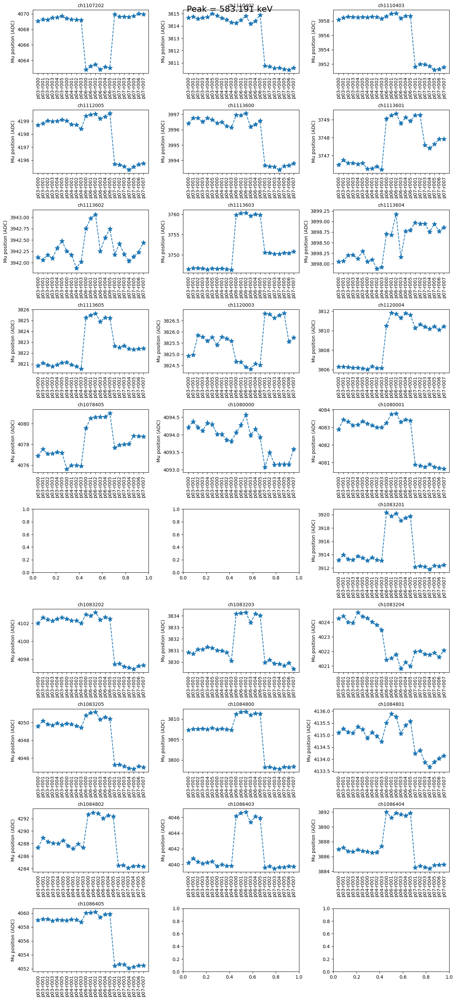


-------------------------------------------------------------------------------------------------

ch1080002 2103.53
ch1083200 2103.53


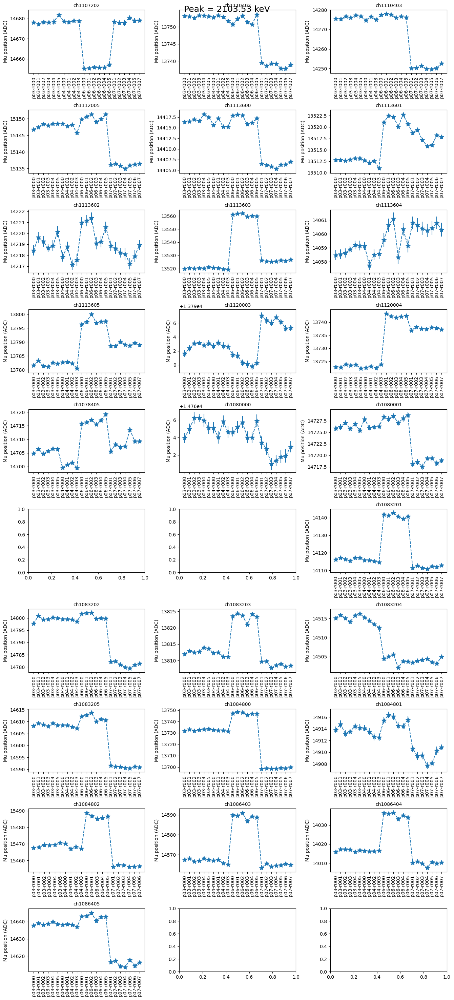


-------------------------------------------------------------------------------------------------

ch1080002 2614.5
ch1083200 2614.5


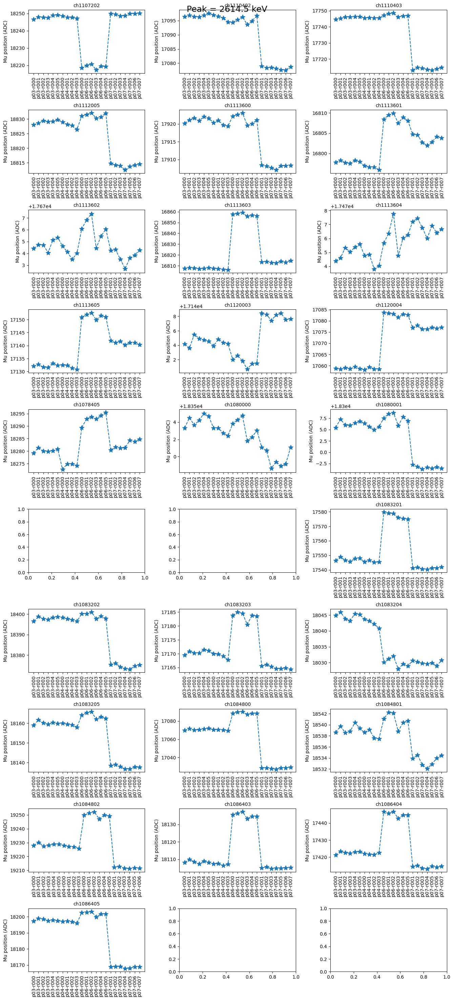


-------------------------------------------------------------------------------------------------



In [15]:
for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['mus_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Mu position (ADC)', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=18)
    plt.tight_layout()
    plt.show()
    print()
    print('-------------------------------------------------------------------------------------------------')
    print()

ch1080002 2614.5
ch1083200 2614.5


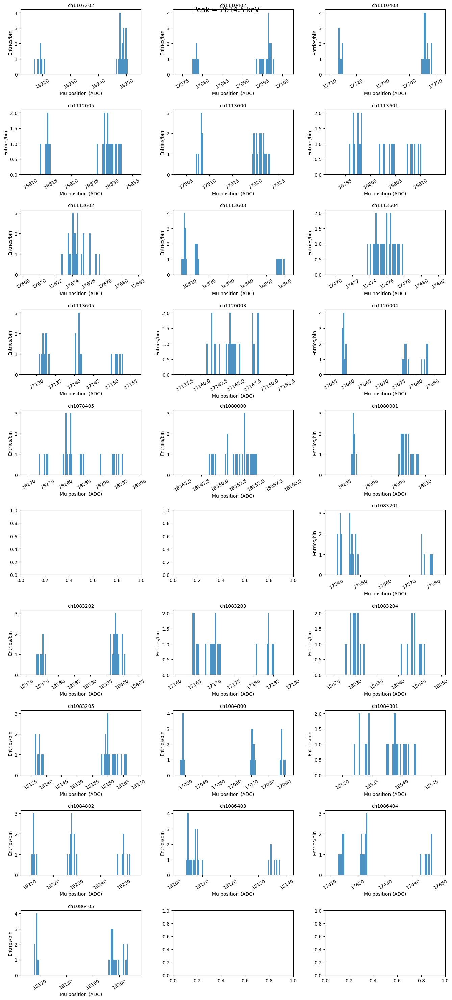

In [16]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.hist(list(all_params_ch[channel]['mus_peaks'][peak].values()), bins=100, label=channel, alpha=0.8,
                   range=(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                          max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5))
            ax.tick_params(axis='x', labelsize=10, rotation=30)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_xlim(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                        max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5)
            ax.set_title(channel, fontsize=10)
            ax.set_xlabel('Mu position (ADC)', fontsize=10)
            ax.set_ylabel('Entries/bin', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### FEP FWHM for all the peaks

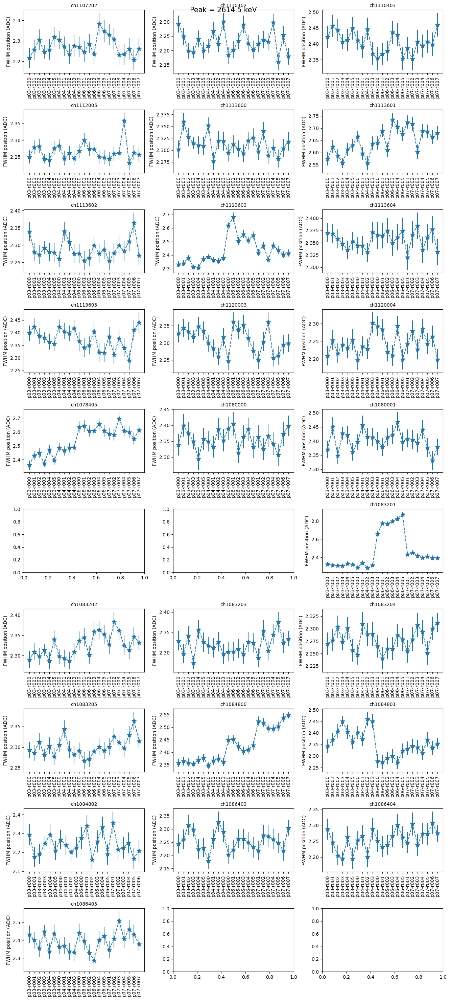

In [17]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['fwhms_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['fwhms_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['fwhms_err_peaks'][peak].values()),
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('FWHM position (ADC)', fontsize=10)
        except KeyError:
            #print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### Qbb res

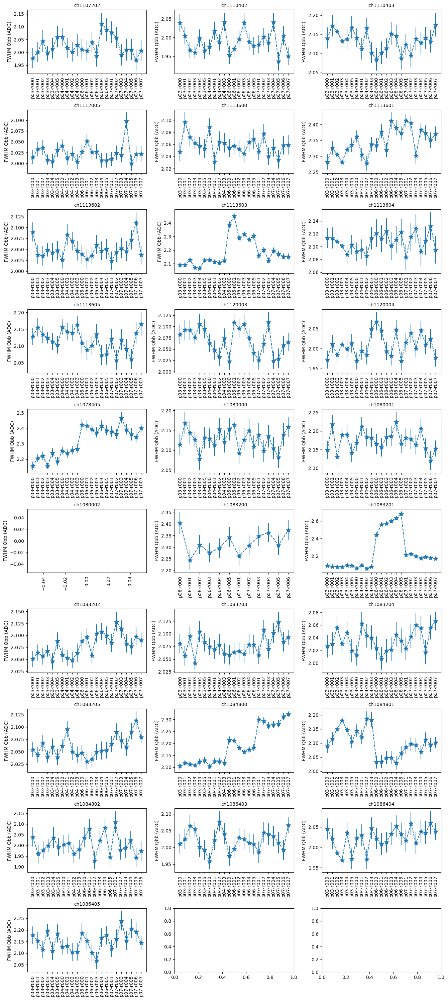

In [18]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                    marker='*', linestyle='--', markersize=10, label=channel)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('FWHM Qbb (ADC)', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

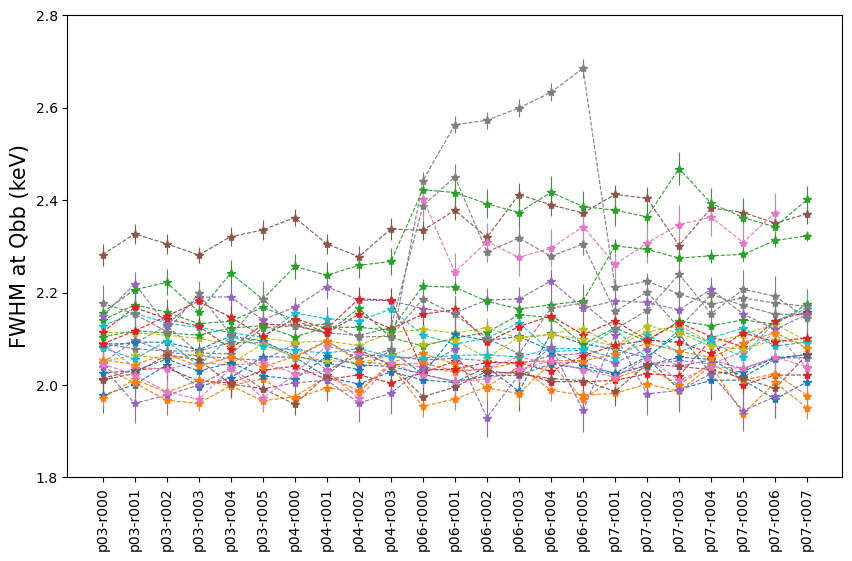

In [19]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    plt.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                 marker='*', linestyle='--', markersize=6, label=channel, linewidth=0.8)
plt.xticks(rotation=90)
plt.ylabel('FWHM at Qbb (keV)', fontsize=15)
plt.ylim(1.8, 2.8)
#plt.legend(fontsize=12, ncol=2)
plt.show()

### Gain

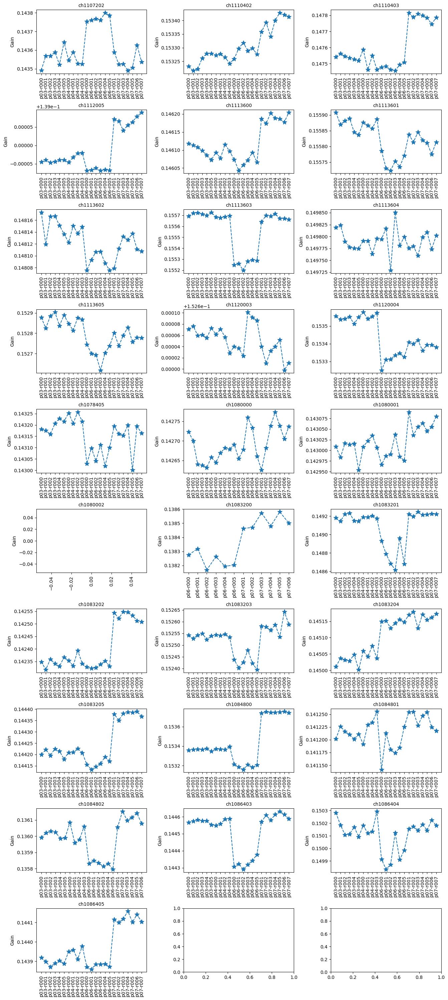

In [20]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                 marker='*', linestyle='--', markersize=10, label=f'Channel {channel}')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Gain', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

### Residuals

ch1080002
ch1083200


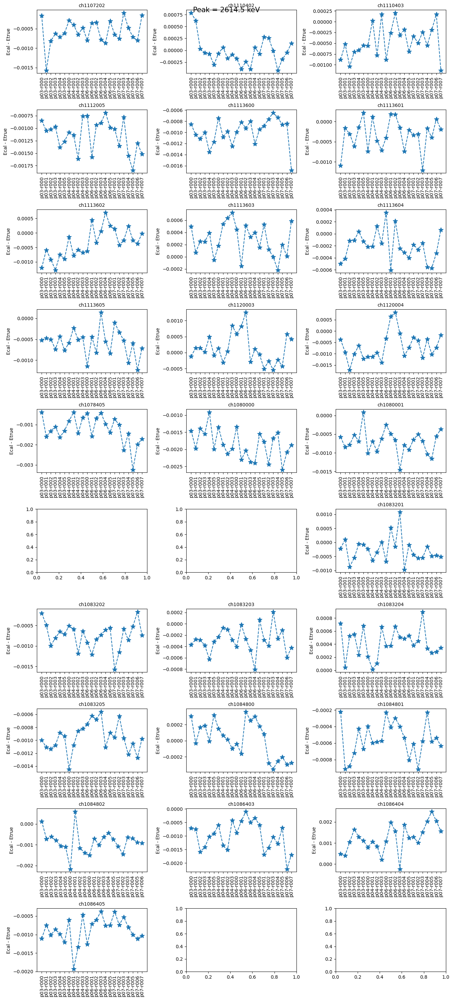

In [21]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['ecals_peaks'][peak].keys()), 
                        np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak,
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Ecal - Etrue', fontsize=10)
            fig.suptitle(f'Peak = {peak} keV', fontsize=15)
        except KeyError:
            print(channel)
            continue
    plt.tight_layout()
    plt.show()

ch1080002
ch1083200


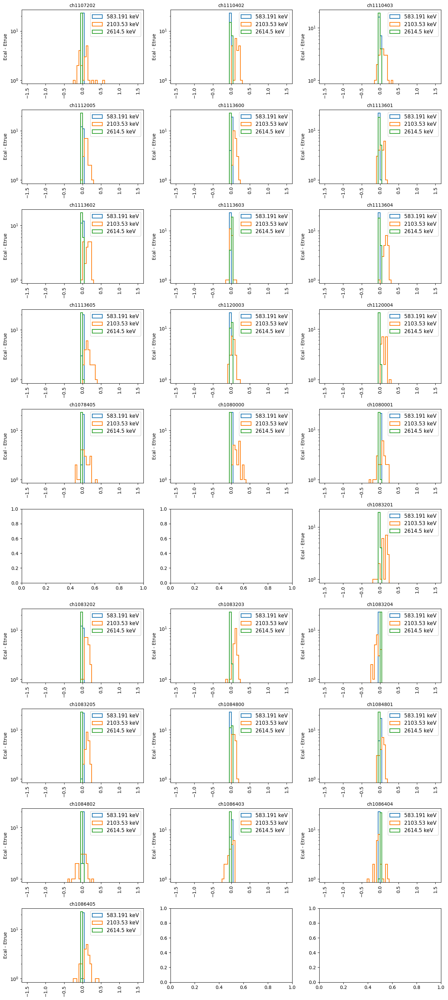

In [22]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
            ax.hist(np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, bins=60, range=(-1.5, 1.5), histtype='step', linewidth=1.5, label=f'{peak} keV')
                
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Ecal - Etrue', fontsize=10)
        #ax.set_xlim(-0.5, 0.5)
        ax.set_yscale('log')
        ax.legend(fontsize=11)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

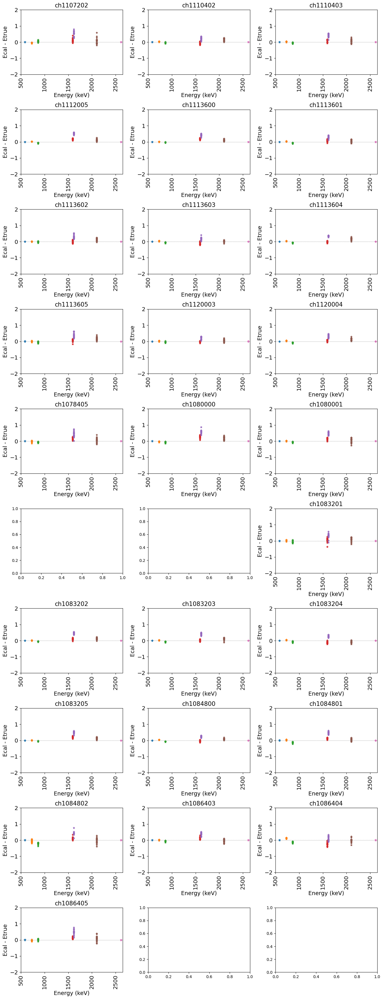

In [23]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 35))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.axhline(y=0, linestyle='--', linewidth=0.5, color='grey')
        for i, peak in enumerate(all_fitted_peaks):
            ax.scatter(np.full(len(all_params_ch[channel]['ecals_peaks'][peak].values()), peak), np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, marker='*', s=20)
        ax.tick_params(axis='x', labelsize=14, rotation=90)
        ax.tick_params(axis='y', labelsize=14)
        ax.set_xlabel('Energy (keV)', fontsize=14)
        ax.set_ylabel('Ecal - Etrue', fontsize=14)
        ax.set_title(channel, fontsize=15)
        ax.set_xlim(500, 2650)
        ax.set_ylim(-2, 2)
    except KeyError:
        continue
plt.tight_layout()
plt.show()

### Gain and mu position

ch1080002
ch1083200


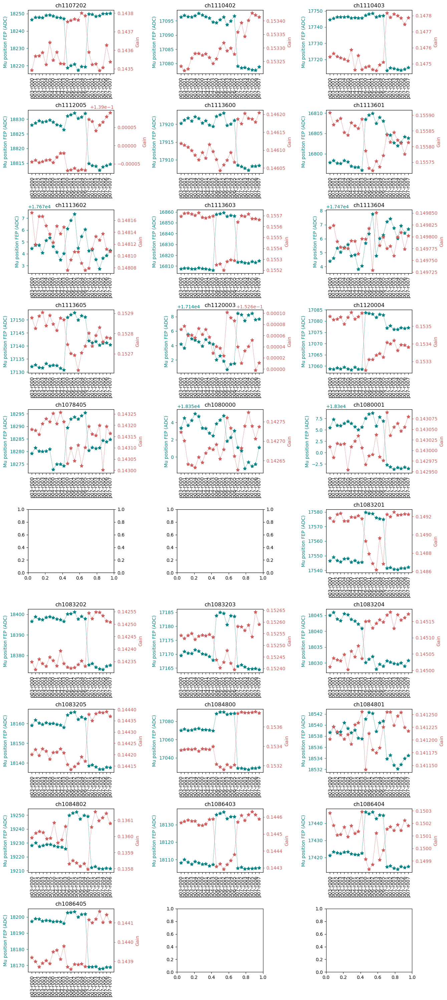

In [24]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax2 = ax.twinx()
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][2614.5].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][2614.5].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][2614.5].values()), 
                     marker='*', linestyle='--', markersize=8, label=channel, color='teal', linewidth=0.5)
        
        ax2.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                    [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                     marker='*', linestyle='--', markersize=8, label=f'Channel {channel}', color='indianred', linewidth=0.5)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params( axis='y', labelsize=10, colors='teal')
        ax2.set_ylabel('Gain', color='indianred')
        ax2.tick_params(axis='y', labelsize=10, colors='indianred')
        
        
        ax.set_ylabel('Mu position FEP (ADC)', color='teal')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.set_title(channel)
        #ax.set_ylim(0.146, 0.16)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

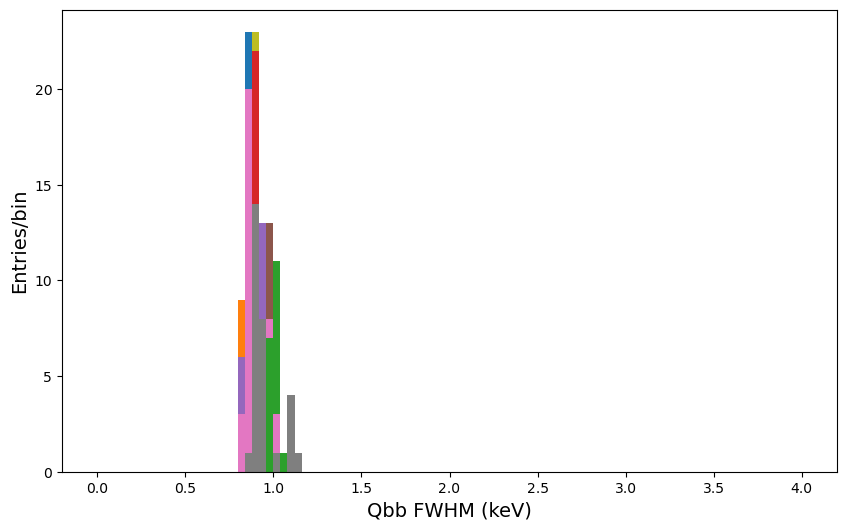

In [25]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_ch   = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    Qbb_fwhm_keys = np.array([list(el.keys  ())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    plt.hist(Qbb_fwhm_ch/2.355, bins=100, range=(0, 4), label=channel+f', $\sigma$ = {np.round(np.mean(Qbb_fwhm_ch/2.355), decimals=2)} keV')
plt.xlabel('Qbb FWHM (keV)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
plt.show()

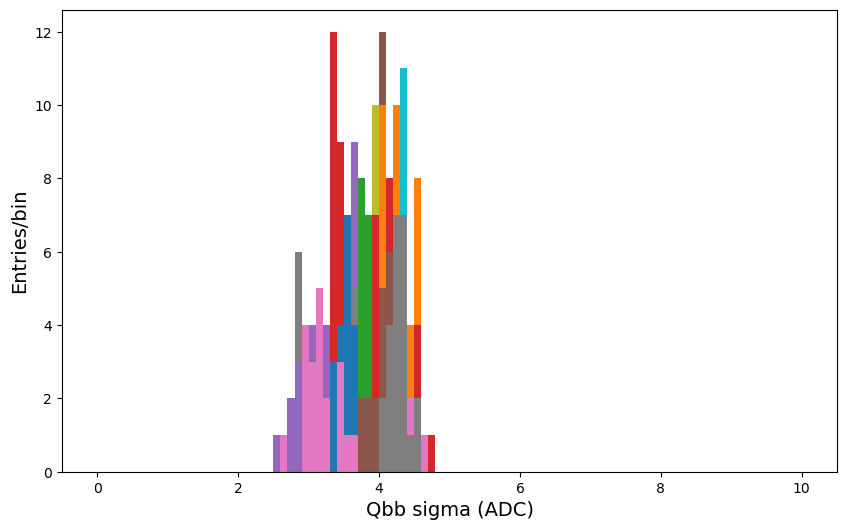

In [26]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_uncal = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])
    Qbb_sig_uncal  = Qbb_fwhm_uncal/2.355
    plt.hist(Qbb_sig_uncal, bins=100, range=(0, 10), label=channel)
plt.xlabel('Qbb sigma (ADC)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
#plt.legend(fontsize=12)
plt.show()

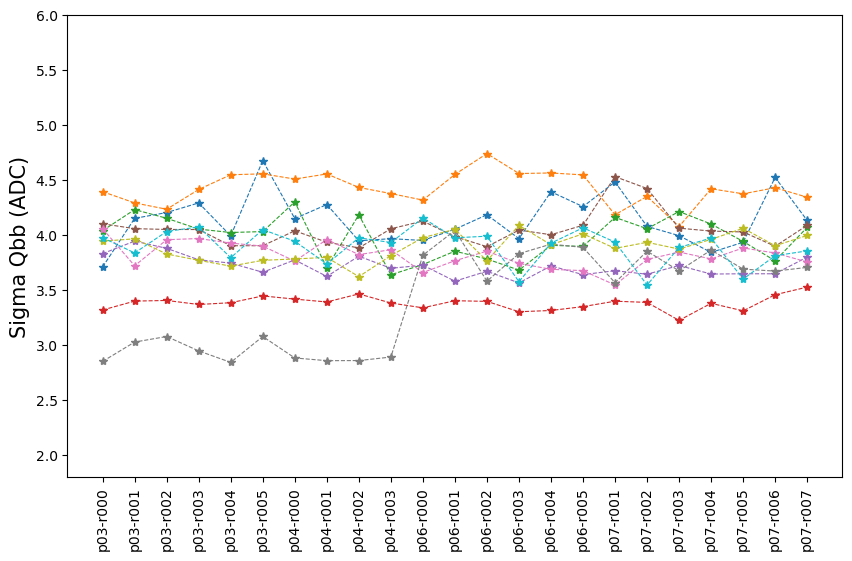

28


In [27]:
fig = plt.figure(figsize=(10, 6))
for channel in list(all_params_ch.keys())[:10]:
    Qbb_fwhm_uncal = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])
    Qbb_sig_uncal  = Qbb_fwhm_uncal/2.355
    plt.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_ADC']],
                 Qbb_sig_uncal, marker='*', linestyle='--', markersize=6, label=channel, linewidth=0.8)
plt.xticks(rotation=90)
plt.ylabel('Sigma Qbb (ADC)', fontsize=15)
plt.ylim(1.8, 6)
#plt.legend(fontsize=12, ncol=2)
plt.show()
print(len(all_params_ch.keys()))

In [28]:
def compute_and_plot_partition(channel, peak, col='teal', ylim=''):
    mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
    sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
    
    partition_change = [0]
    start_mu = 0
    for i,(mu,sig) in enumerate(zip(mus, sigmas)):
        if i==0:
            start_mu = mu
        else:
            if np.abs(mu - start_mu) > np.abs(sig):
                partition_change.append(i)
            start_mu = mu
    partition_change.append(len(mus)-1)
    
    fig, ax = plt.subplots(1, 1, figsize=(7, 4))
    det_type = channel_dict[int(channel[2:])][0]
    det_name = channel_dict[int(channel[2:])][1]
    ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                list(all_params_ch[channel]['mus_peaks'][peak].values()),
                yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                marker='*', linestyle='--', markersize=10, label=det_type, color=col)
    
    color_list   = ['teal', 'grey', 'orange', 'indianred']
    cycle_colors = cycle(color_list)

    for i,col in zip(range(len(partition_change)-1), cycle_colors):
        ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                   list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
    ax.tick_params(axis='x', labelsize=14, rotation=90)
    ax.tick_params(axis='y', labelsize=13)
    ax.set_title(f'{det_type}, ({det_name})', fontsize=15)
    ax.set_ylabel('Mu position (ADC)', fontsize=15)
    if ylim:
        ax.set_ylim(ylim[0], ylim[1])
    else:
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-25,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+25)
        
    plt.show()

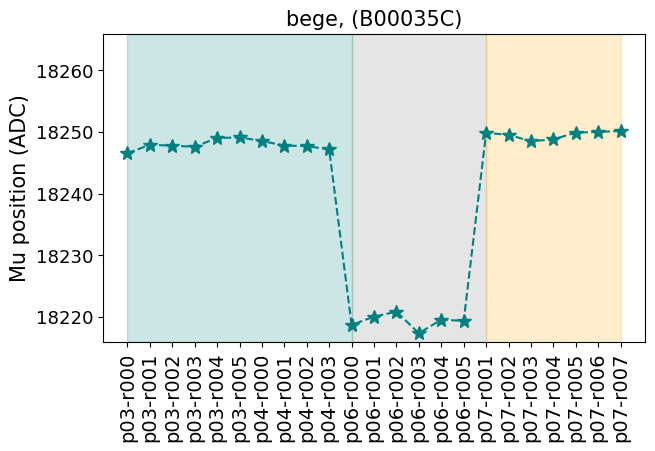

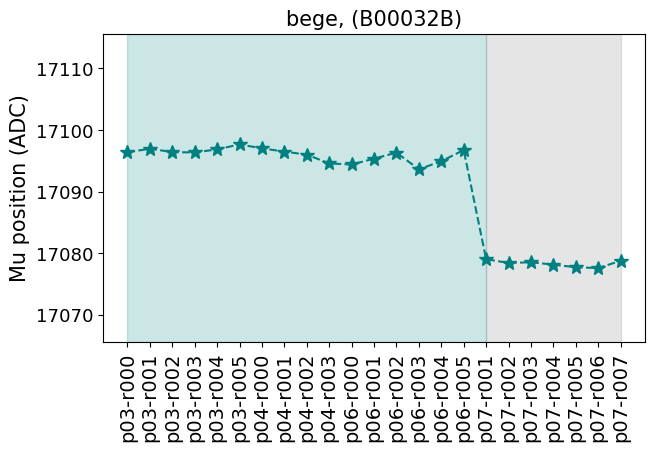

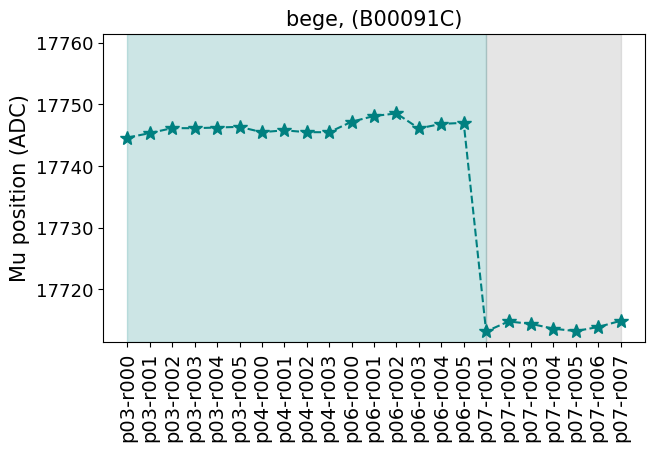

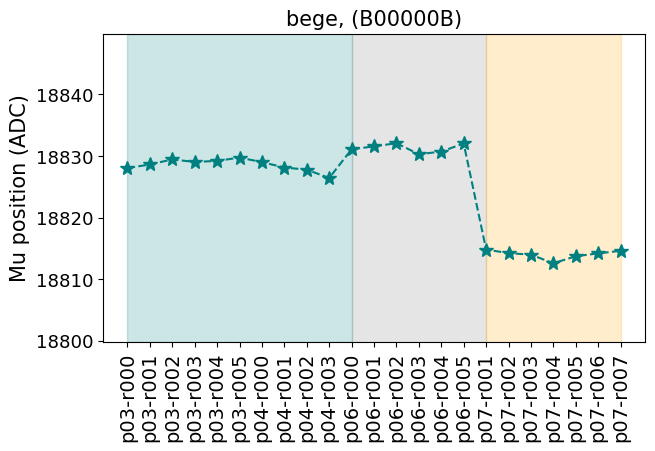

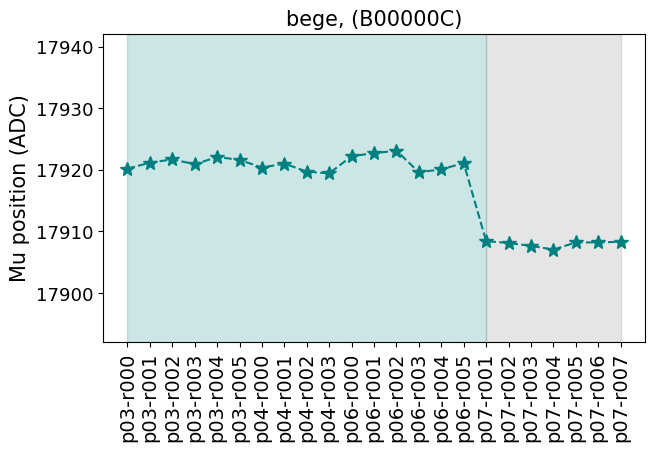

...

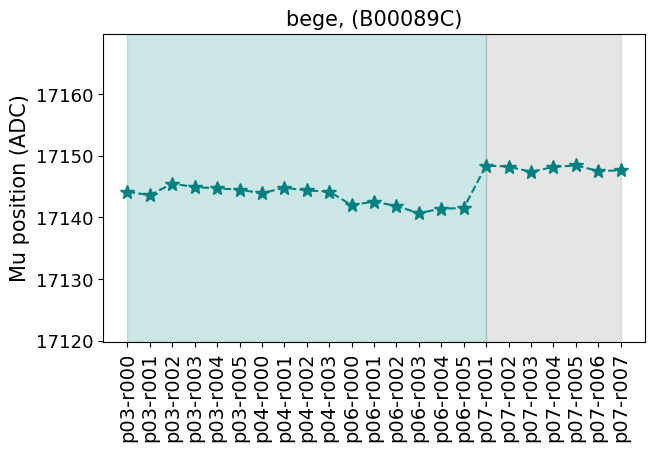

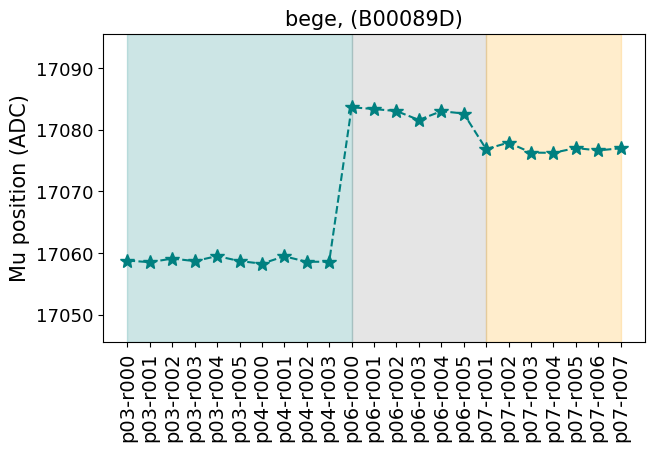

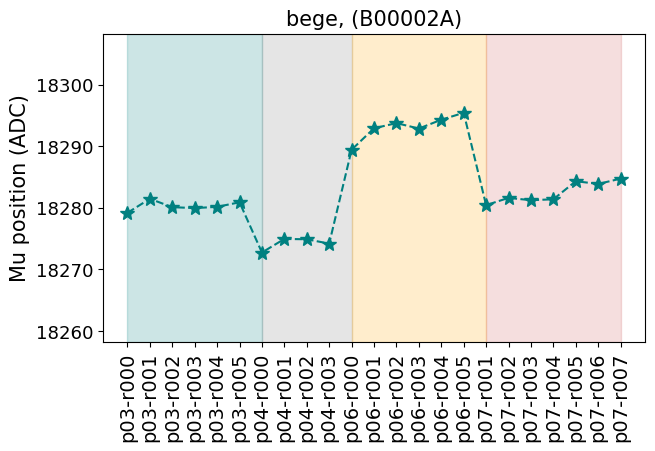

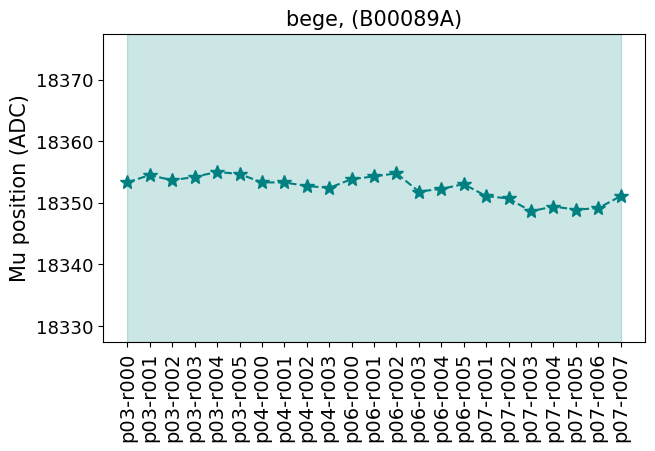

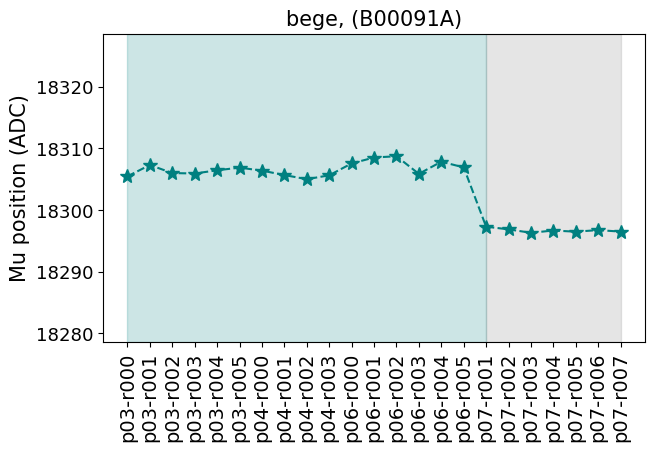

ch1080002
ch1083200


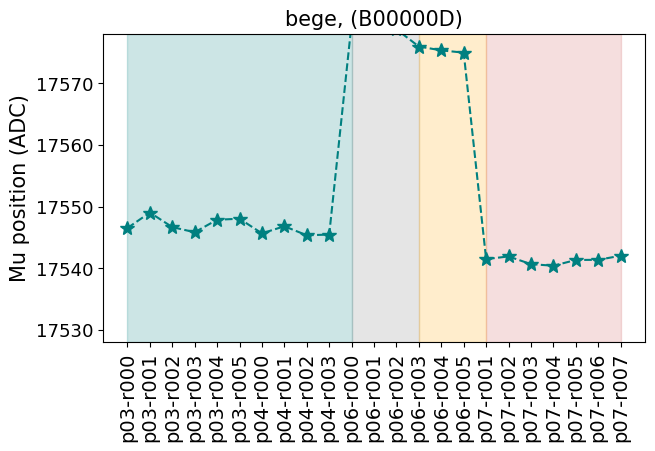

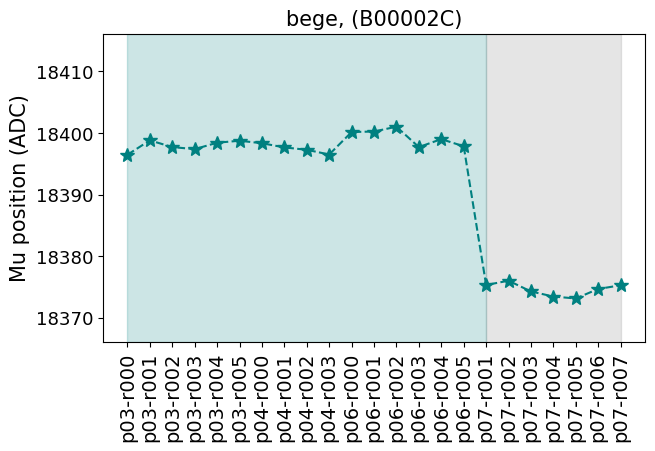

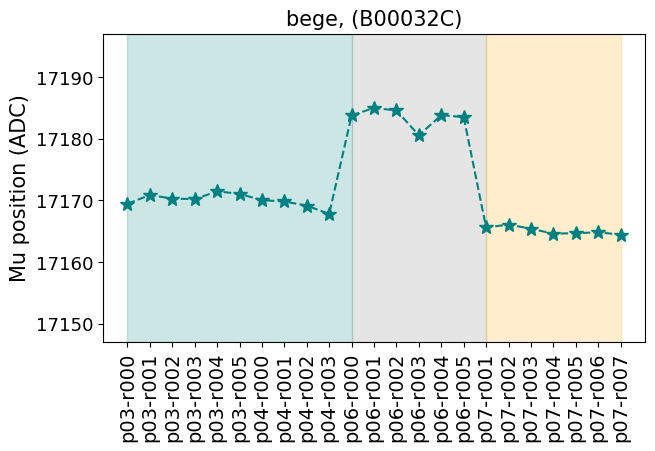

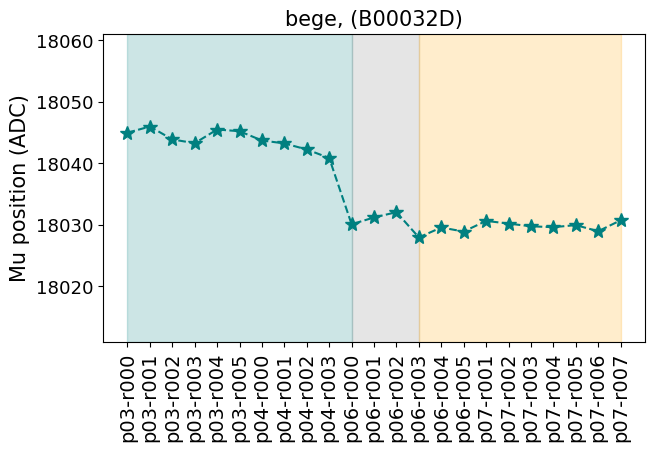

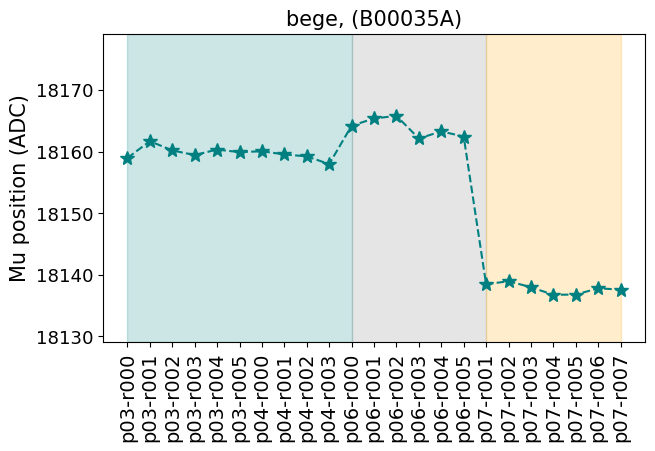

...

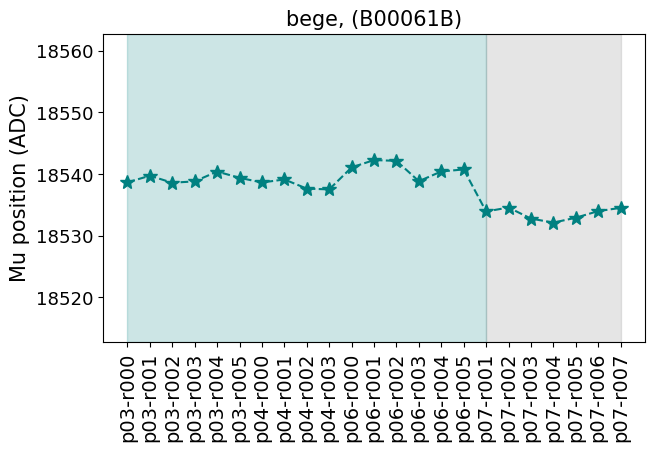

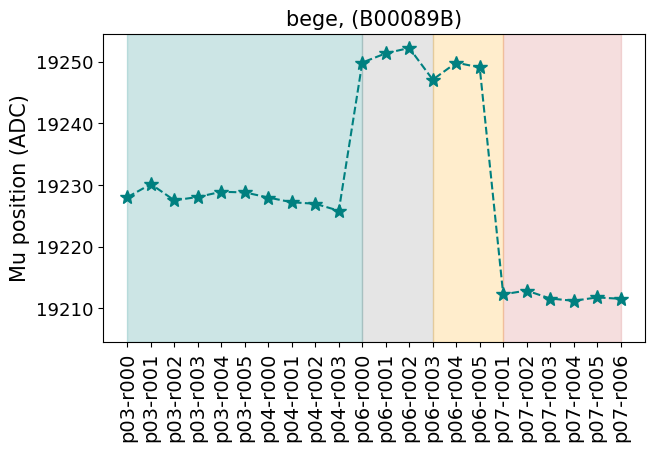

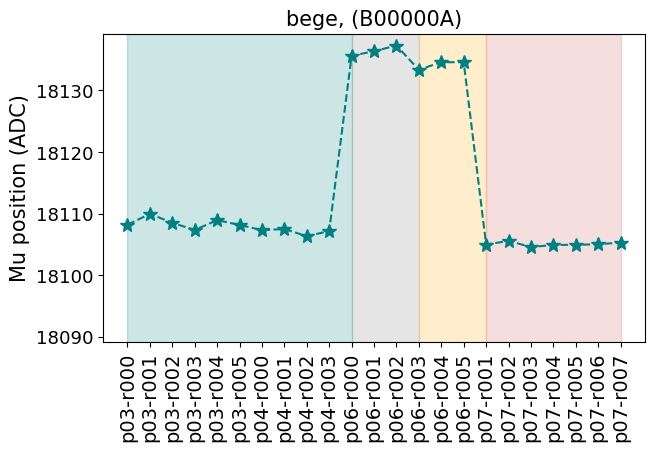

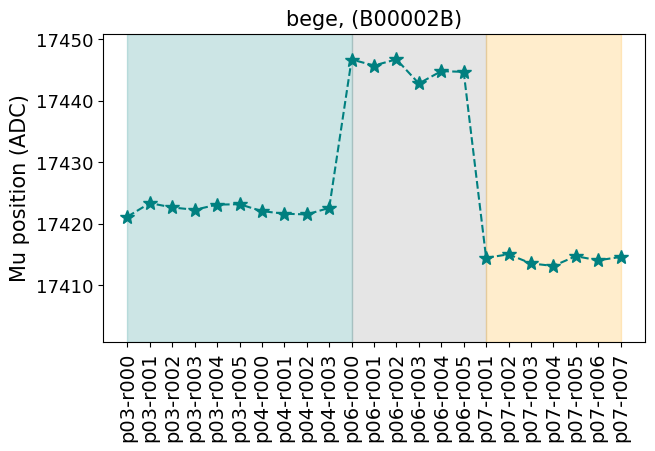

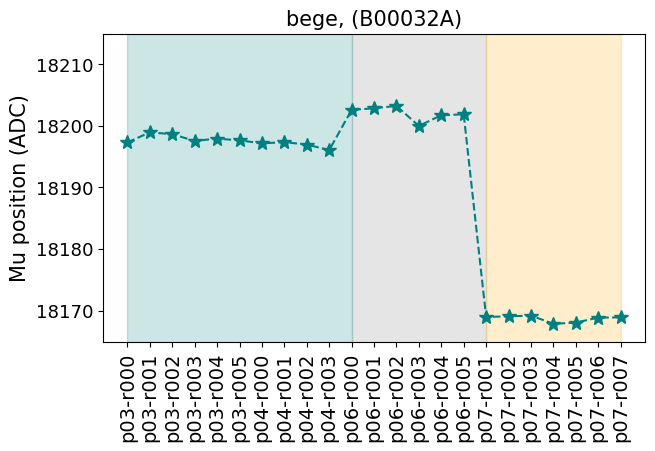

In [29]:
for channel in all_params_ch.keys():
    try:
        compute_and_plot_partition(channel, all_fitted_peaks[6])
    except KeyError:
        print(channel)
        continue

ch1080002
ch1083200


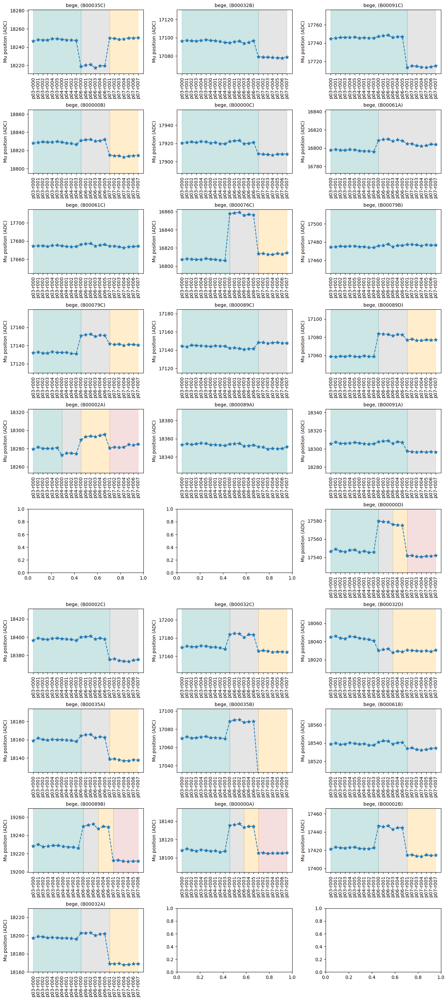

In [30]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)

        color_list   = ['teal', 'grey', 'orange', 'indianred']
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-30,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+40)
    except KeyError:
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

In [31]:
good_channels = ['ch1107202', 'ch1110402', 'ch1110403', 'ch1112005', 'ch1113600', 'ch1113601', 'ch1113602',
                 'ch1113603', 'ch1113604', 'ch1113605', 'ch1120003', 'ch1120004', 'ch1078405', 'ch1080000',
                 'ch1080001', 'ch1083201', 'ch1083202', 'ch1083203', 'ch1083204', 'ch1083205', 'ch1084800',
                 'ch1084801', 'ch1084802', 'ch1086403', 'ch1086404', 'ch1086405']

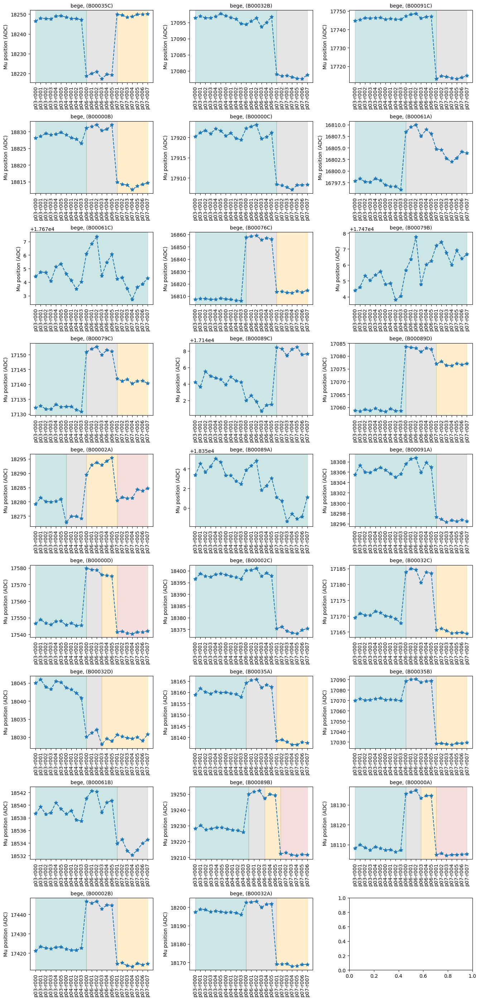

In [32]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(good_channels)/3)), 3, figsize=(13.5, 28))
for i, (ax, channel) in enumerate(zip(axs.flatten(), good_channels)):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        #print(channel)
        continue
    
plt.tight_layout()    
plt.show()

### Try with the mean of sigma E res

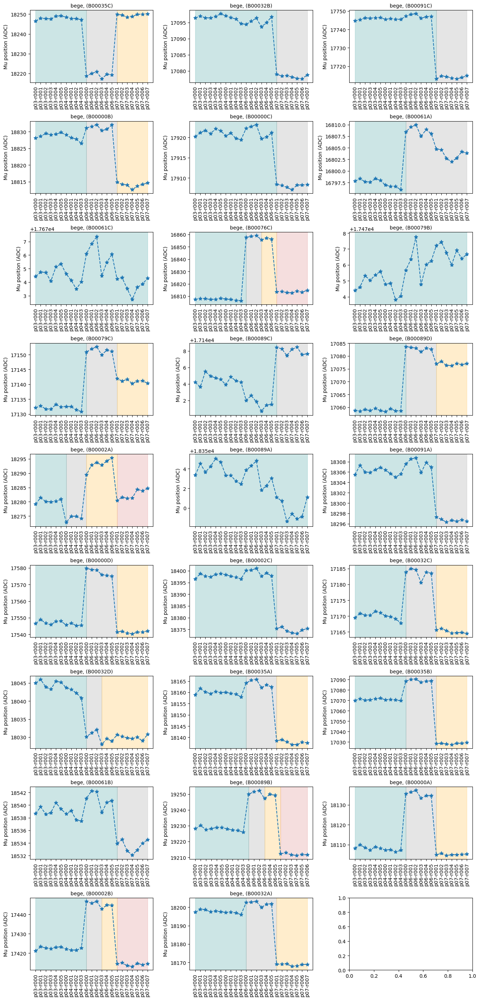

In [33]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(good_channels)/3)), 3, figsize=(13.5, 28))
for i, (ax, channel) in enumerate(zip(axs.flatten(), good_channels)):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.mean(sigmas):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        continue
    
plt.tight_layout()    
plt.show()

### Doubtful channels

In [34]:
for i,k in enumerate(all_params_ch.keys()):
    if i==17:
        print(k)

ch1083201


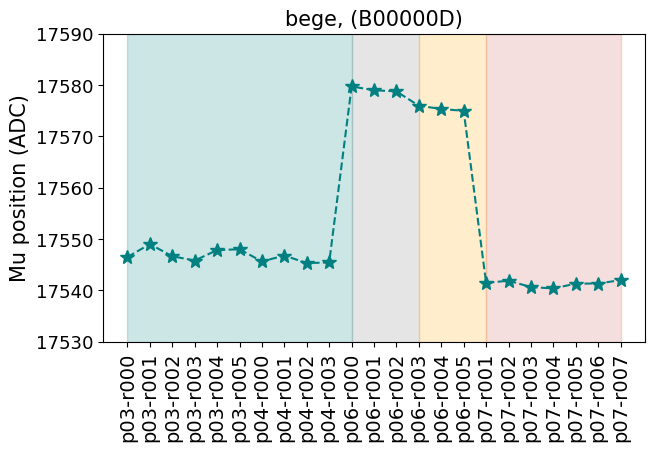

In [35]:
compute_and_plot_partition('ch1083201', all_fitted_peaks[6], ylim=(17530, 17590))
#compute_and_plot_partition('ch1083202', all_fitted_peaks[6], ylim=(12500, 14000))
#compute_and_plot_partition('ch1118402', all_fitted_peaks[6])
#compute_and_plot_partition('ch1121602', all_fitted_peaks[6], ylim=(13750, 13770))
#compute_and_plot_partition('ch1078400', all_fitted_peaks[6])

ch1080002
ch1083200


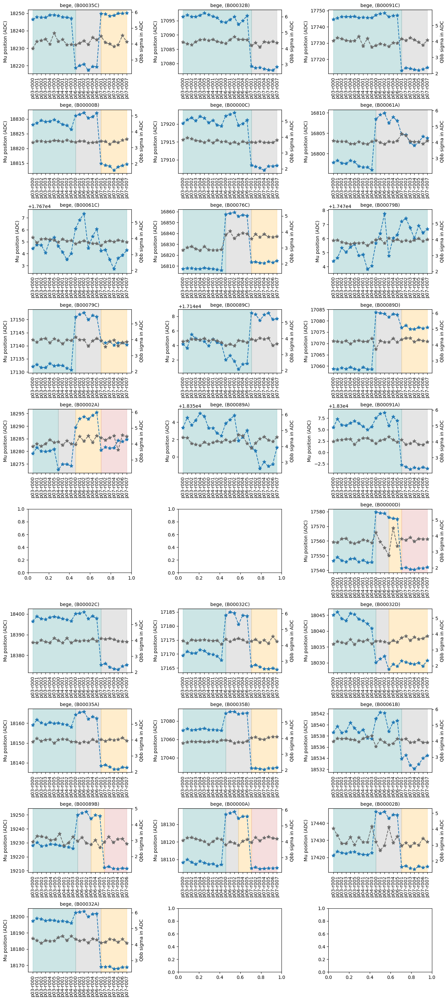

In [36]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        #for i,mu in enumerate(mus):
        #    if i==0:
        #        start_mu = mu
        #    else:
        #        if np.abs(mu - start_mu) > np.mean(sigmas):
        #            partition_change.append(i)
        #        start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        print(channel)
        continue
    except ValueError:
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

[0, 10, 16, 22] [0, 10, 13, 16, 22]


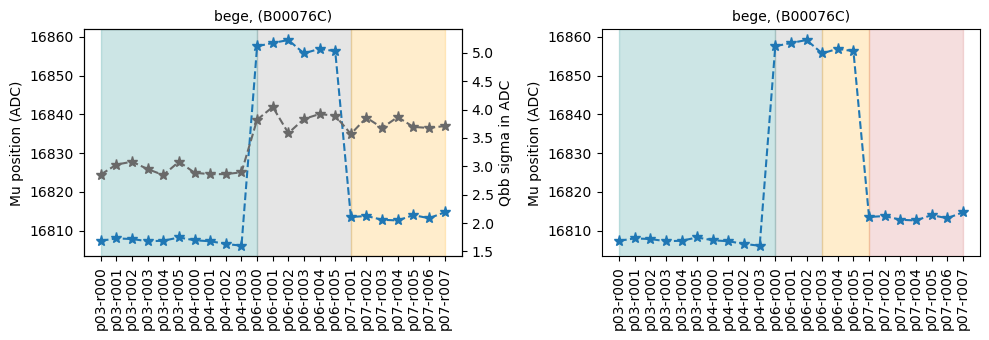

ch1080002
ch1083200
[0, 10, 13, 16, 22] [0, 10, 16, 22]


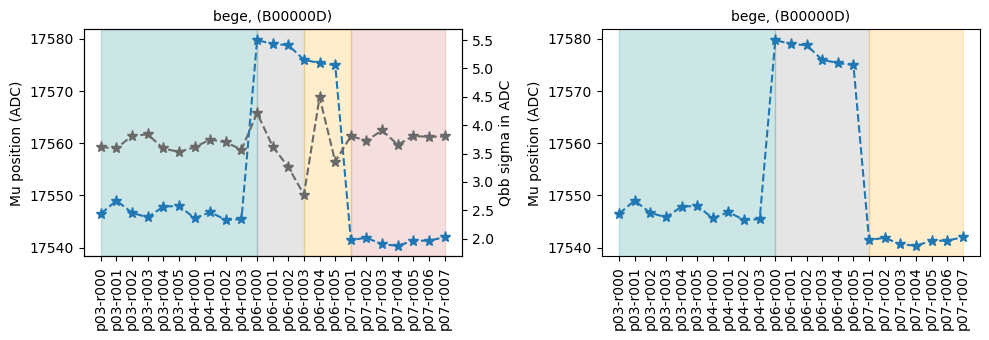

[0, 10, 13, 16, 22] [0, 10, 16, 22]


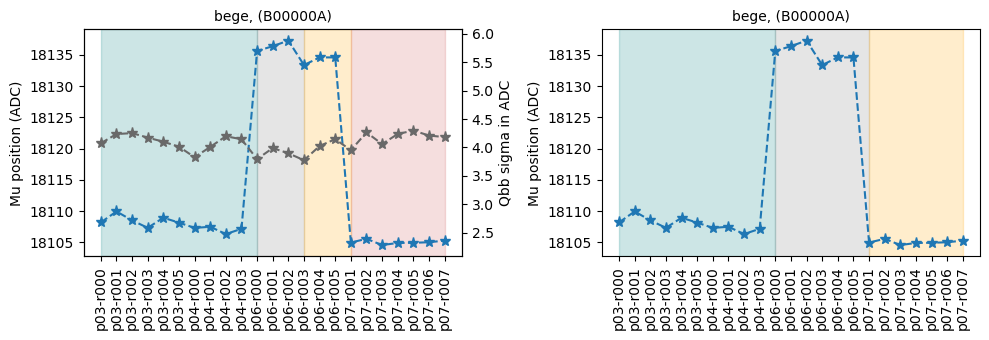

[0, 10, 16, 22] [0, 10, 13, 16, 22]


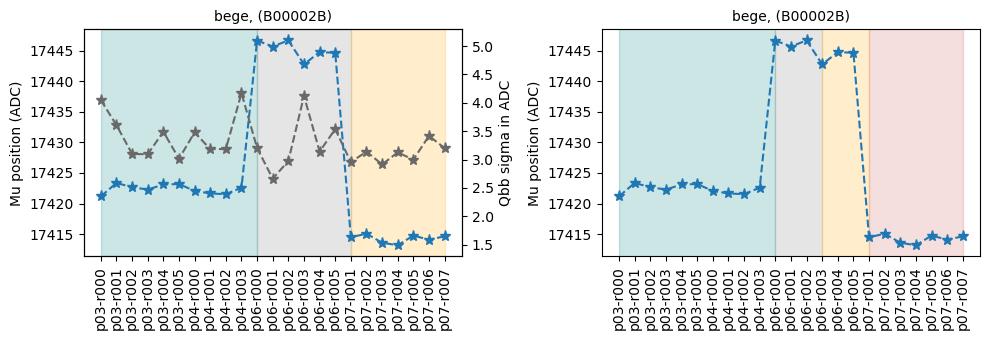

In [37]:
peak = all_fitted_peaks[6]
for i, channel in enumerate(all_params_ch.keys()):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change0 = [0]
        partition_change1 = [0]
        start_mu0 = 0
        start_mu1 = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu0 = mu
            else:
                if np.abs(mu - start_mu0) > np.abs(sig):
                    partition_change0.append(i)
                start_mu0 = mu
        partition_change0.append(len(mus)-1)
        for i,mu in enumerate(mus):
            if i==0:
                start_mu1 = mu
            else:
                if np.abs(mu - start_mu1) > np.mean(sigmas):
                    partition_change1.append(i)
                start_mu1 = mu
        partition_change1.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        
        if partition_change0 == partition_change1:
            continue
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 3.5))
        ax0.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax1.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax0.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')

        print(partition_change0, partition_change1)
        for i,col in zip(range(len(partition_change0)-1), cycle(color_list)):
            ax0.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i+1]], alpha=0.2, color=col)
        for i,col in zip(range(len(partition_change1)-1), cycle(color_list)):
            ax1.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i+1]], alpha=0.2, color=col)
        ax0.tick_params(axis='x', labelsize=10, rotation=90)
        ax0.tick_params(axis='y', labelsize=10)
        ax0.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax0 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax1.tick_params(axis='x', labelsize=10, rotation=90)
        ax1.tick_params(axis='y', labelsize=10)
        ax1.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax1 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        print(channel)
        continue
    except ValueError:
        print(channel)
        continue
    plt.tight_layout()    
    plt.show()